# Procesamiento de Imágenes:Operaciones Punto, Convolución y Filtros

Este notebook está diseñado para que los estudiantes aprendan a procesar imágenes utilizando filtros convolucionales y operaciones punto a punto, y exploren sus aplicaciones en el análisis de texturas, realce y segmentación.

## Introducción a Operaciones Punto

**¿Qué son las operaciones punto?**

Estas operaciones transforman cada píxel de una imagen de manera independiente, utilizando una función matemática que aplica la misma regla a todos los píxeles. Son más simples que las convoluciones y no dependen de los valores de píxeles vecinos.

**Aplicaciones comunes:**

* Ajuste de brillo.
* Modificación del contraste.
* Umbralización (binarización).
* Aplicación de funciones matemáticas (logarítmica, cuadrática, etc.).

**Ejemplo básico:**

$Salida(x,y)=f(Entrada(x,y))$

Donde $f$ puede ser cualquier función matemática, como multiplicar por un valor constante o aplicar un logaritmo.

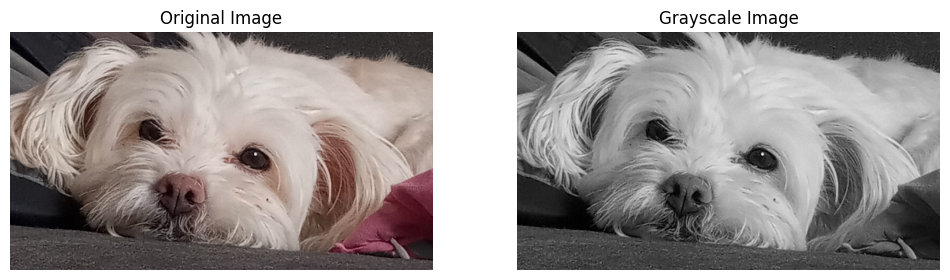

In [1]:
# Environment configuration

import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage import color, exposure

# Load an image
image = imread("imagenes/notebook_2/blanca.jpg")

# convert RGB image into grayscale image
image_gray = color.rgb2gray(image) # Image is an range of [0, 1]

# Show 
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Grayscale Image")
plt.imshow(image_gray, cmap='gray')
plt.axis('off')
plt.show()

### Ajuste de Brillo

Se suma o resta un valor constante a cada píxel de la imagen.

**NOTA**: Esto desplaza el histograma de la imágen

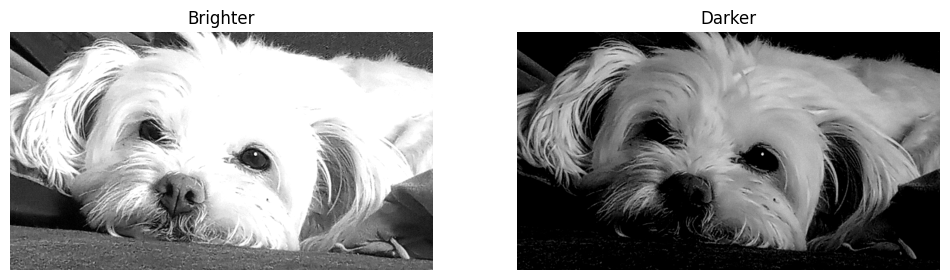

In [2]:
def adjust_brightness(image, delta):
    return np.clip(image + delta, 0, 1)

# Apply different brightness levels
bright_image = adjust_brightness(image_gray, 0.3)
dark_image = adjust_brightness(image_gray, -0.3)


plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Brighter")
plt.imshow(bright_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Darker")
plt.imshow(dark_image, cmap='gray')
plt.axis('off')
plt.show()

### Modificación de Contraste

El contraste se ajusta multiplicando cada píxel por un valor constante.

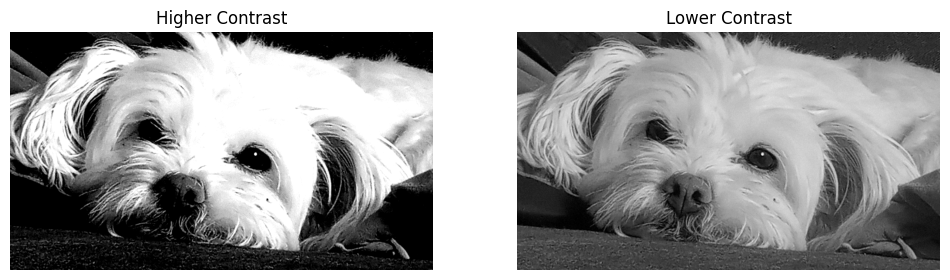

In [3]:
def adjust_contrast(image, alpha):
    # Valor medio de la imagen (representa su brillo)
    mean_intensity = np.mean(image)
    return np.clip(alpha * (image - mean_intensity) + mean_intensity, 0, 1)

# Aplicar diferentes niveles de contraste
high_contrast = adjust_contrast(image_gray, 2)
low_contrast = adjust_contrast(image_gray, 0.5)

# Mostrar resultados
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Higher Contrast")
plt.imshow(high_contrast, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Lower Contrast")
plt.imshow(low_contrast, cmap='gray')
plt.axis('off')
plt.show()

### Umbralización

Se convierte la imagen en binaria asignando valores de 0 o 1 según un umbral.

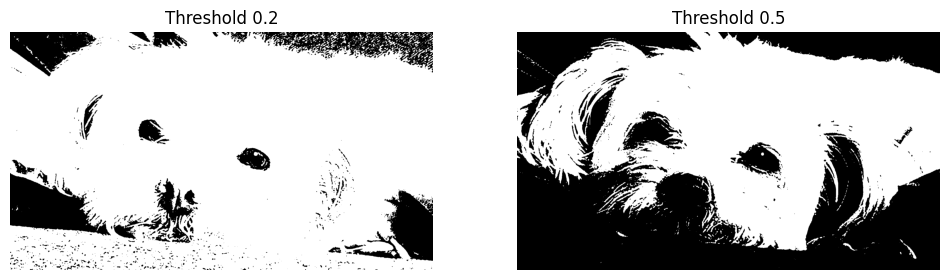

In [4]:
def thresholding(image, threshold):
    return (image > threshold).astype(float)

# Aplicar umbralización con diferentes umbrales
threshold_02 = thresholding(image_gray, 0.2)
threshold_05 = thresholding(image_gray, 0.5)

# Mostrar resultados
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Threshold 0.2")
plt.imshow(threshold_02, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Threshold 0.5")
plt.imshow(threshold_05, cmap='gray')
plt.axis('off')
plt.show()

### Aplicación de Funciones Matemáticas

Se pueden aplicar funciones como logaritmos, raíces, o cuadráticas para modificar la apariencia.

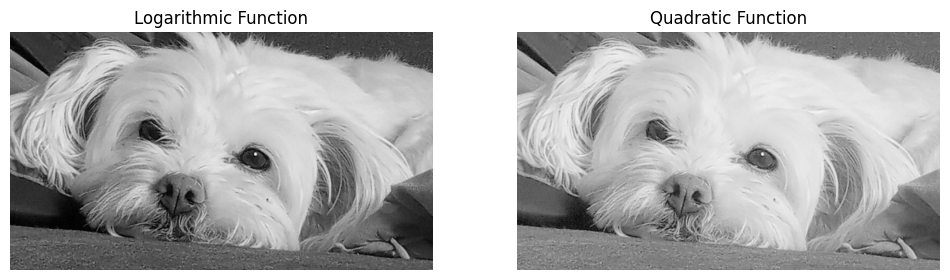

In [5]:
def apply_function(image, func):
    return np.clip(func(image), 0, 1)

# Funciones logarítmica y cuadrática
log_image = apply_function(image_gray, np.log1p)
sqrt_image = apply_function(image_gray, np.sqrt)

# Mostrar resultados
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Logarithmic Function")
plt.imshow(log_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Quadratic Function")
plt.imshow(sqrt_image, cmap='gray')
plt.axis('off')
plt.show()

# Actividades a realizar

## Actividad A1: Experimenta con el brillo

1. Ajusta el brillo de la imagen usando valores de $\delta$ entre -0.5 y 0.5.
2. ¿Qué ocurre si se usan valores fuera del rango permitido?

### Apartado 1

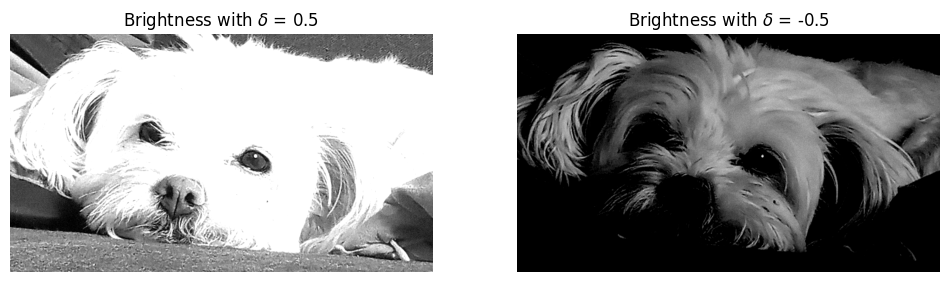

In [6]:
# Obtenemos dos imagenes: Una usando una delta de -0.5 y otra de 0.5
delta_0_5_image     : np.ndarray = adjust_brightness(image_gray, 0.5)
delta_neg_0_5_image : np.ndarray = adjust_brightness(image_gray, -0.5)

# Ahora las ploteamos
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Brightness with $\delta$ = 0.5")
plt.imshow(delta_0_5_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Brightness with $\delta$ = -0.5")
plt.imshow(delta_neg_0_5_image, cmap='gray')
plt.axis('off')
plt.show()

**Respuesta:** Los valores de $\delta$ más cercanos a 0.5 harán la imagen más brillante, mientras que los valores de $\delta$ más cercanos a -0.5 harán la imágen más oscura

### Apartado 2

Como la función para ajustar brillo ```adjust_birghtness``` utiliza la función de numpy ```np.clip``` -- la cual *clipea* los valores fuera del rango en los extremos del mismo (que en este caso es \[0, 1\]) --, si se utiliza un valor $\delta$ mayor a 1 o menor a -1, la función devolverá una imagén de "todo 1's" o "todo 0's", lo cuál es una imágen completamente blanca y una negra respectivamente.

Por tanto, el rango de valores de brillo permitido es (-1, 1)

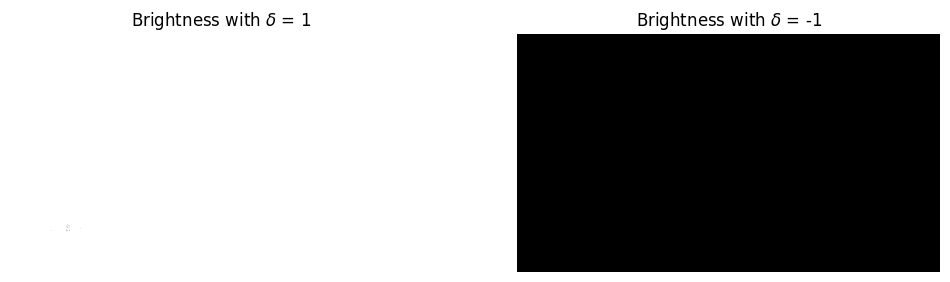

In [7]:
# Veamos un ejemplo de lo anterior:
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Brightness with $\delta$ = 1")
plt.imshow(adjust_brightness(image_gray, 0.99999999999999), cmap='gray') # Valor muy cerca de 1 porque la imágen de todo 1's la interpreta como una imágen completamente negra
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Brightness with $\delta$ = -1")
plt.imshow(adjust_brightness(image_gray, -1), cmap='gray')
plt.axis('off')
plt.show()

## Actividad A2: Contraste personalizado

1. Implementa una función para invertir los colores de la imagen.
2. Ajusta el contraste para imágenes con baja y alta intensidad promedio.

### Apartado 1

Queremos una función que lleve los 1's en 0's y los o's en 1's, aplicando la misma lógica a todos los valores intermedios.

Para ello, basta con restar 1 a la imágen en escala de grises (dado que sus valores están entre 0 y 1)

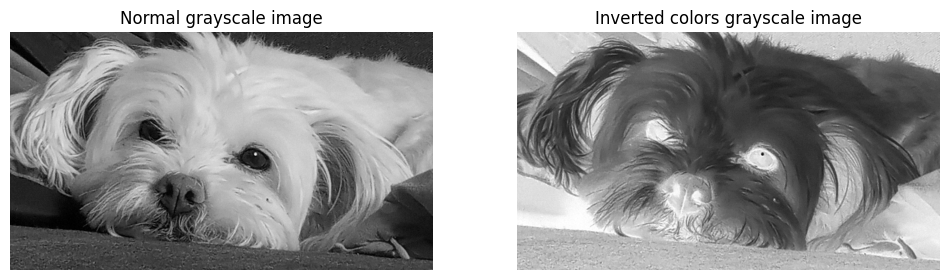

In [8]:
def invert_colors(img : np.ndarray) -> np.ndarray:
    return 1 - img

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Normal grayscale image")
plt.imshow(image_gray, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Inverted colors grayscale image")
plt.imshow(invert_colors(image_gray), cmap='gray')
plt.axis('off')
plt.show()

### Apartado 2

Variamos los valores de $\alpha$ sobre la imágen en escala de grises con colores invertidos

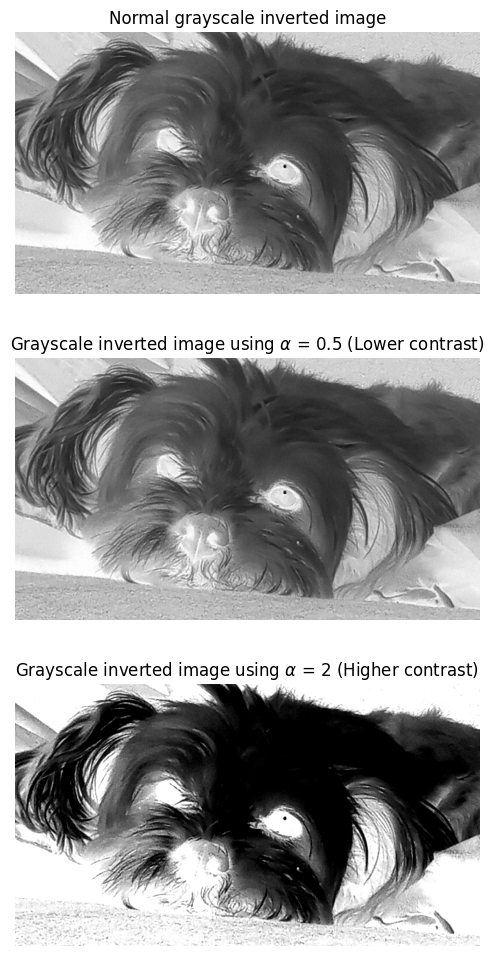

In [9]:
grayscale_inverted_image : np.ndarray = invert_colors(image_gray)

plt.figure(figsize=(6, 12))
plt.subplot(3, 1, 1)
plt.title("Normal grayscale inverted image")
plt.imshow(grayscale_inverted_image, cmap='gray')
plt.axis('off')

plt.subplot(3, 1, 2)
plt.title("Grayscale inverted image using $\\alpha$ = 0.5 (Lower contrast)")
plt.imshow(adjust_contrast(grayscale_inverted_image, 0.5), cmap='gray')
plt.axis('off')

plt.subplot(3, 1, 3)
plt.title("Grayscale inverted image using $\\alpha$ = 2 (Higher contrast)")
plt.imshow(adjust_contrast(grayscale_inverted_image, 2), cmap='gray')
plt.axis('off')

plt.show()


## Actividad A3: Crear una máscara binaria

1. Aplica umbralización para resaltar las regiones más oscuras de la imagen.
2. Combina máscaras binarias con operaciones de suma o multiplicación para resaltar ciertas áreas.

### Apartado 1:

Exploramos distintos umbrales hasta dar con uno que resalte las regiones más oscuras

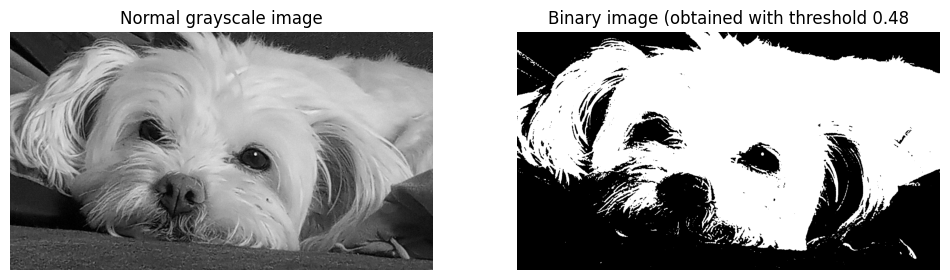

In [10]:
# Umbral
threshold : float = 0.48

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Normal grayscale image")
plt.imshow(image_gray, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title(f"Binary image (obtained with threshold {threshold}")
plt.imshow(thresholding(image_gray, threshold), cmap='gray') # El resaltado es demasiado brusco, pero funciona...
plt.axis('off')

plt.show()

### Apartado 2:

Utilizamos dos umbrales y el producto (equivalente a un AND lógico sobre imágenes binarias) para dar con una imágen similar a la original pero con las regiones más oscuras resltadas

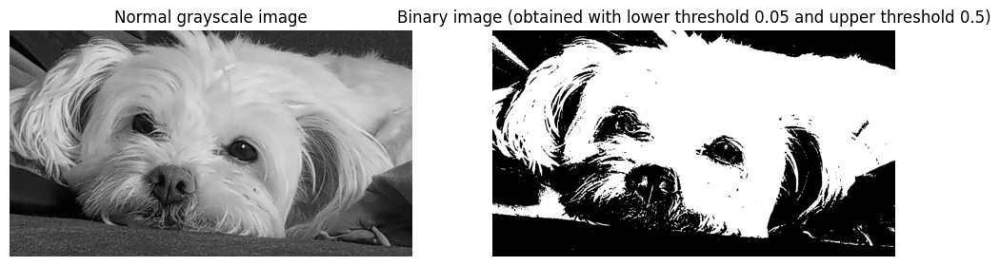

In [11]:
# Umbrales (tomare todos los valores en el rango que definan)
upper_threshold : float = 0.5
lower_threshold : float = 0.05

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Normal grayscale image")
plt.imshow(image_gray, cmap='gray')
plt.axis('off')

# Imagen umbralizada en el rango
bool_to_int = lambda x : 0 if x else 1
bool_to_int_vectorial = np.vectorize(bool_to_int) # Funcion vectorial para convertir booleanos a enteros (True -> 0, False -> 1)
umbralized_img : np.ndarray = bool_to_int_vectorial((image_gray < upper_threshold) * (image_gray > lower_threshold)) # Esto es lo mismo que un 'AND'!

plt.subplot(1, 2, 2)
plt.title(f"Binary image (obtained with lower threshold {lower_threshold} and upper threshold {upper_threshold})")
plt.imshow(umbralized_img, cmap='gray')
plt.axis('off')

plt.show()

## Actividad A4: Explora funciones avanzadas

1. Implementa una función que combine un logaritmo y una raíz cuadrada.
2. Aplica funciones trigonométricas (por ejemplo, seno o coseno) a la imagen y observa los resultados.

## Apartado 1:

Usaremos la función $f(x) = \sqrt{\max\{\ln{(\alpha + x)}, 0\}}$, donde $\alpha \in (0, 1]$ y lo usaremos para evitar obtener 0 en el logaritmo neperiano (es indeterminado en este punto). Adicionalmente, tomamos el máximo entre el logaritmo y 0 para evitar valores negativos en la raíz.

Luego, observamos que a mayores valores de $\alpha$ menos contraste tiene la imágen. Por tanto, parece que la función $f$ diseñada es una "pseudo-función de ajuste de contraste"

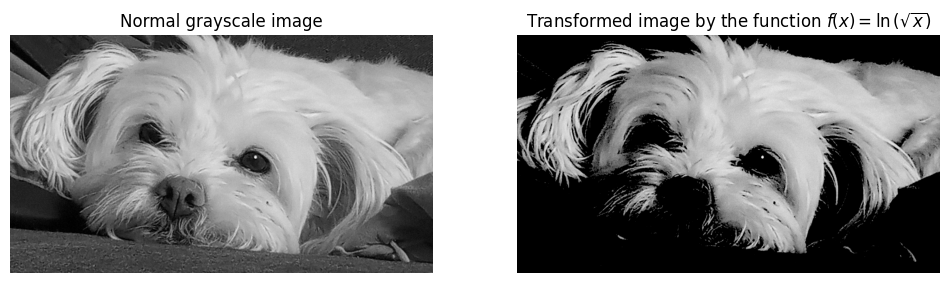

In [12]:
transformed_img : np.ndarray = np.clip(np.sqrt(np.maximum(np.log(0.5 + image_gray), 0)), 0, 1)

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Normal grayscale image")
plt.imshow(image_gray, cmap='gray')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Transformed image by the function $f(x) = \ln{(\sqrt{x})}$")
plt.imshow(transformed_img, cmap='gray')
plt.axis('off')

plt.show()

### Apartado 2:

Aprovechando que tenemos que aplicar funciones trigonométricas, veamos una relación interesante!

Se sabe que $\sin(x) = x$ para valores de $x$ pequeños (hipótesis que se verifica, pues los valores de nuestra imágen están entre 0 y 1). Luego:

$\sin^2(x) + \cos^2(x) = 1$

$\implies \cos^2(x) = 1 - \sin^2(x)$

$\implies \cos^2(x) = 1 - x²$

$\implies \cos(x) = \sqrt{(1 - x²)}$

Apliquemos ambas funciones y veamos el resultado.

**Nota:** Hay que convertir las intensidades de la imagen a radianes primero!

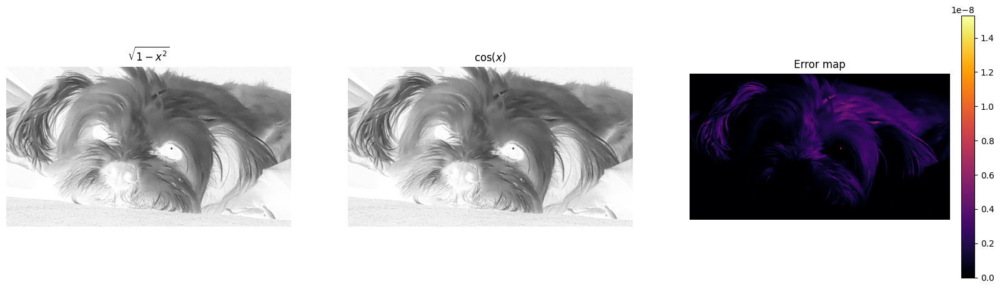

In [13]:
sqrt_image     : np.ndarray = np.sqrt(1-np.pow(np.pi*image_gray/180,2))
cos_img        : np.ndarray =  np.cos(np.pi*image_gray/180)
abs_err        : np.ndarray = sqrt_image - cos_img
normalized_err : np.ndarray = np.clip(np.pow(abs_err, 2)/np.max(np.abs(abs_err)), 0, 1) # Mapa de error normalizado

plt.figure(figsize=(20, 20))

plt.subplot(1, 3, 1)
plt.title("$\sqrt{1-x^2}$")
plt.imshow(sqrt_image, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("$\cos(x)$")
plt.imshow(cos_img, cmap='gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title("Error map")
error_map_axs = plt.imshow(normalized_err, cmap='inferno')
plt.axis('off')
plt.colorbar(error_map_axs, fraction=0.046, pad=0.04)

plt.show()

Luego, podemos notar lo minúsculo de los errores, siendo del orden de $10^{-8}$

# Procesamiento de Imágenes con Convolución y Filtros

**Introducción a la Convolución**

**¿Qué es la convolución?**

La convolución es una operación matemática que combina una imagen con un filtro (kernel) para producir una nueva imagen. El filtro recorre la imagen pixel por pixel y realiza un cálculo que resalta características específicas, como bordes, texturas o áreas suavizadas.

$O(x, y) = \sum_{i=-k}^{k} \sum_{j=-k}^{k} I(x+i, y+j) \cdot K(i, j)$

- $O(x, y)$: Valor de la imagen de salida en el píxel $(x, y)$.
- $I(x+i, y+j)$: Valor de la imagen de entrada en el píxel $(x+i, y+j)$ (píxel vecino influenciado por el kernel).
- $K(i, j)$: Valor del kernel en la posición $(i, j)$.
- $k$: Define el tamaño del kernel. Por ejemplo, para un kernel de $3 \times 3$, $k=1$.

Esta operación desplaza el kernel sobre toda la imagen, moviéndose píxel a píxel, y calcula la suma ponderada de los píxeles vecinos para producir el resultado.


**¿Cómo funciona?**

1. El filtro (una matriz de números pequeños) se coloca sobre la imagen.
2. Cada elemento del filtro se multiplica con los valores de píxeles correspondientes en la imagen.
3. Los resultados se suman para obtener un único valor, que se asigna al píxel correspondiente en la imagen resultante.

**¿Para qué se usa?**

1. Detección de bordes.
2. Suavizado o desenfoque.
3. Realce de características.
4. Análisis de texturas.

**Terminología:**

1. Kernel: Matriz pequeña que define el filtro.
2. Stride: El número de píxeles que se mueve el kernel cada vez.
3. Padding: Bordes añadidos a la imagen para controlar el tamaño de la salida.

In [14]:
# Initial configuration

import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d
from skimage.io import imread
from skimage import color
from skimage.filters import gabor

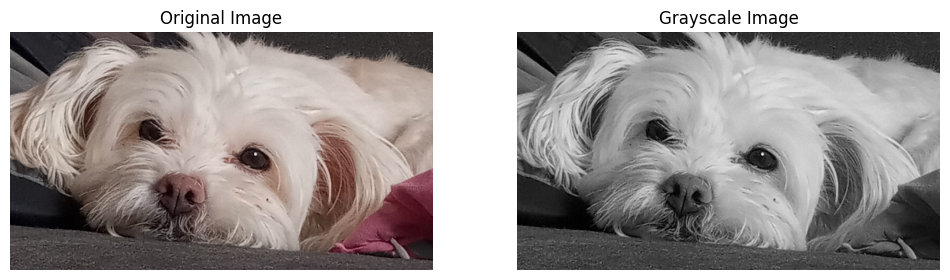

In [15]:
# Load an image
image = imread("imagenes/notebook_2/blanca.jpg")

# convert RGB image into grayscale image
image_gray = color.rgb2gray(image) # Image is an range of [0, 1]

# Show 
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(image)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("Grayscale Image")
plt.imshow(image_gray, cmap='gray')
plt.axis('off')
plt.show()

## Aplicar un Filtro Convolucional: Filtro Básico (Detectar bordes horizontales):

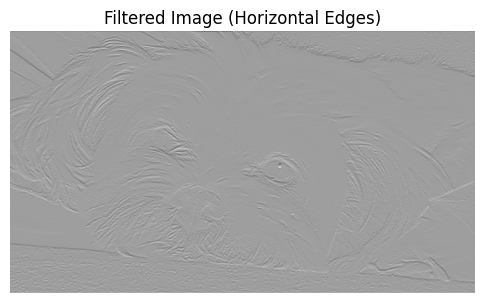

In [16]:
# Filtro de ejemplo
kernel = np.array([[-1, -1, -1],
                   [ 0,  0,  0],
                   [ 1,  1,  1]])

# Aplicar convolución
filtered_image = convolve2d(255*image_gray, kernel, mode='same', boundary='fill', fillvalue=0)

# Mostrar resultado
plt.figure(figsize=(6, 6))
plt.title("Filtered Image (Horizontal Edges)")
plt.imshow(filtered_image, cmap='gray')
plt.axis('off')
plt.show()

## Filtros Predefinidos: Prueba con Diferentes Efectos

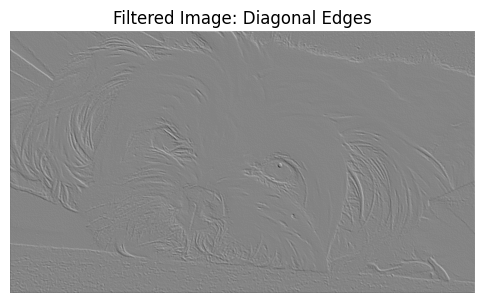

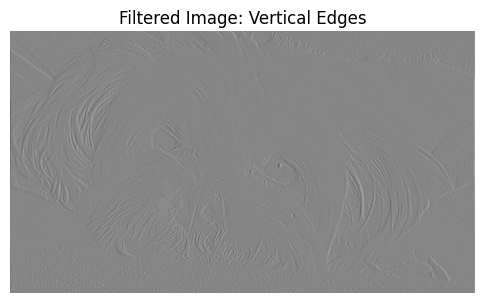

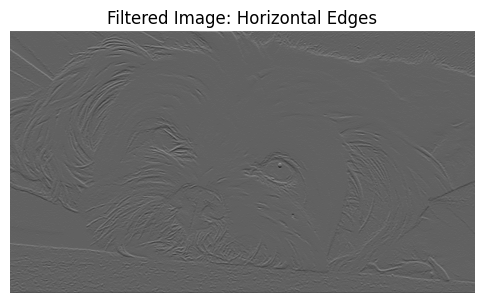

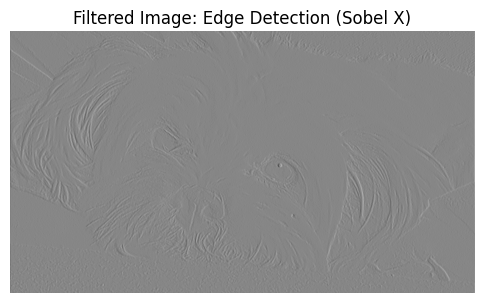

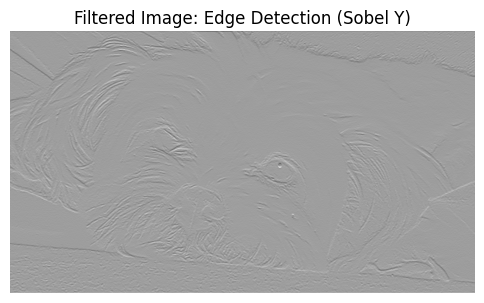

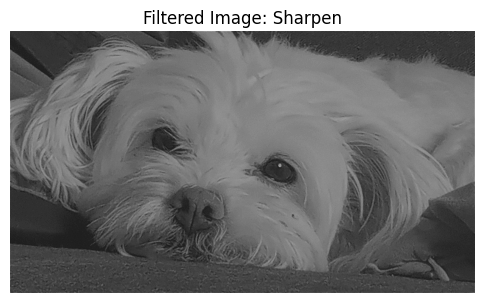

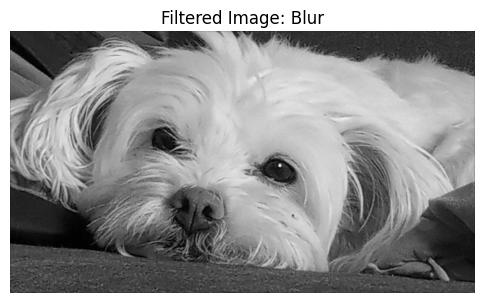

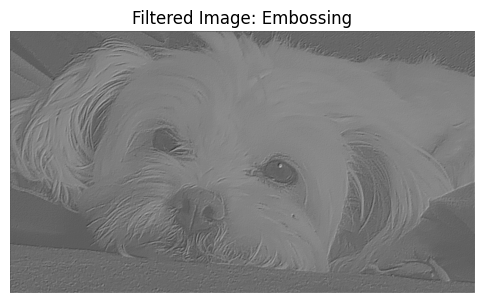

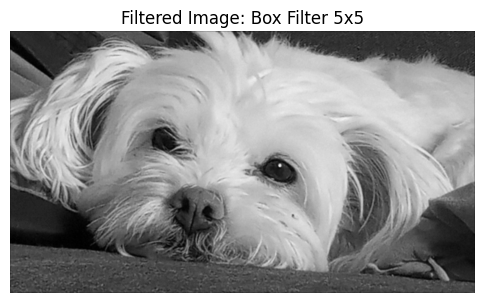

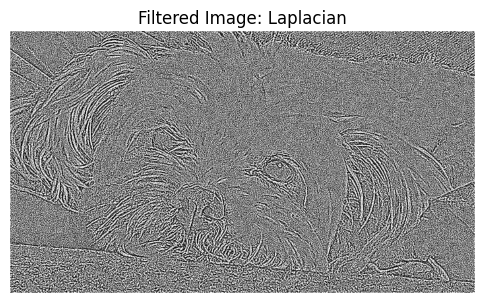

In [17]:
# Definición de varios filtros
filters = {
    "Diagonal Edges": np.array([[  0,   1,  2],
                                [ -1,   0,  1],
                                [ -2,  -1,  0]]),

    "Vertical Edges": np.array([[-1,  0,  1],
                                [-1,  0,  1],
                                [-1,  0,  1]]),

    "Horizontal Edges": np.array([[  1,  1,  1],
                                  [  0,  0,  0],
                                  [ -1, -1, -1]]),

    "Edge Detection (Sobel X)": np.array([[-1,  0,  1],
                                          [-2,  0,  2],
                                          [-1,  0,  1]]),

    "Edge Detection (Sobel Y)": np.array([[-1, -2, -1],
                                          [ 0,  0,  0],
                                          [ 1,  2,  1]]),
    "Sharpen": np.array([[ 0, -1,  0],
                         [-1,  5, -1],
                         [ 0, -1,  0]]),

    "Blur": np.ones((3, 3)) / 9,
    
    "Embossing": np.array([[-2, -1,  0],
                           [-1,  1,  1],
                           [ 0,  1,  2]]),

    "Box Filter 5x5": np.ones((5, 5)) / 25,
    "Laplacian": np.array([[ 0, -1,  0],
                            [-1,  4, -1],
                            [ 0, -1,  0]])
}

# Aplicar y mostrar cada filtro
for name, kernel in filters.items():
    filtered_image = convolve2d(image_gray*255, kernel, mode='same', boundary='fill', fillvalue=0)
    plt.figure(figsize=(6, 6))
    plt.title(f"Filtered Image: {name}")

    # Le hacemos un poco de post-procesado al Laplaciano para poder resaltarlo mejor
    plt.imshow(adjust_brightness(filtered_image, 0.5) if name == "Laplacian" else filtered_image, cmap='gray')
    
    plt.axis('off')
    plt.show()

## Experimentación con Tamaños de Kernel

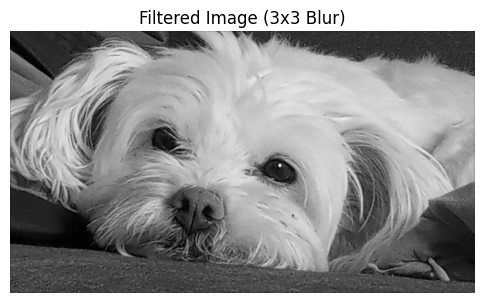

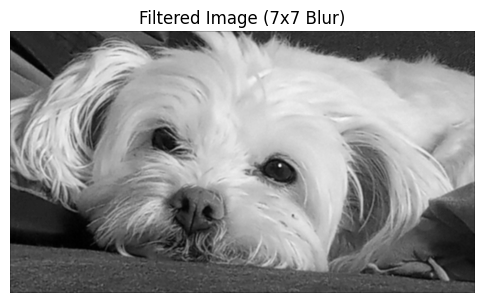

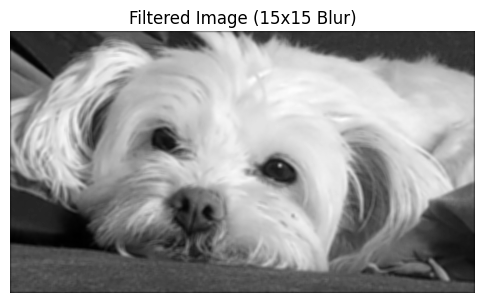

In [18]:
kernels_large_small = {
    "3x3 Blur": np.ones((3, 3)) / 9,
    "7x7 Blur": np.ones((7, 7)) / 49,
    "15x15 Blur": np.ones((15, 15)) / 225
}

for name, kernel in kernels_large_small.items():
    filtered_image = convolve2d(255*image_gray, kernel, mode='same', boundary='fill', fillvalue=0)
    plt.figure(figsize=(6, 6))
    plt.title(f"Filtered Image ({name})")
    plt.imshow(filtered_image, cmap='gray')
    plt.axis('off')
    plt.show()

## Mezclar Filtros

Combined Filter:
 [[-2  0  2]
 [-2  1  2]
 [-2  0  2]]


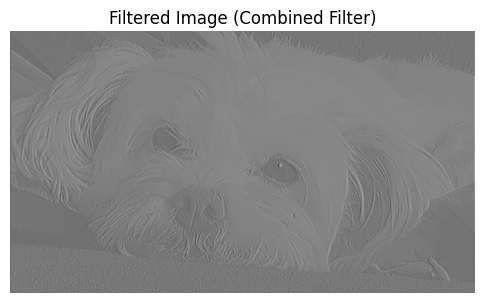

In [19]:
# Combinación de filtros
combined_kernel = filters["Diagonal Edges"] + filters["Embossing"]
print("Combined Filter:\n", combined_kernel)

# Aplicar filtro combinado
combined_image = convolve2d(255*image_gray, combined_kernel, mode='same', boundary='fill', fillvalue=0)

# Mostrar resultado
plt.figure(figsize=(6, 6))
plt.title("Filtered Image (Combined Filter)")
plt.imshow(combined_image, cmap='gray')
plt.axis('off')
plt.show()

## Visualización de Kernels como Mapas de Calor

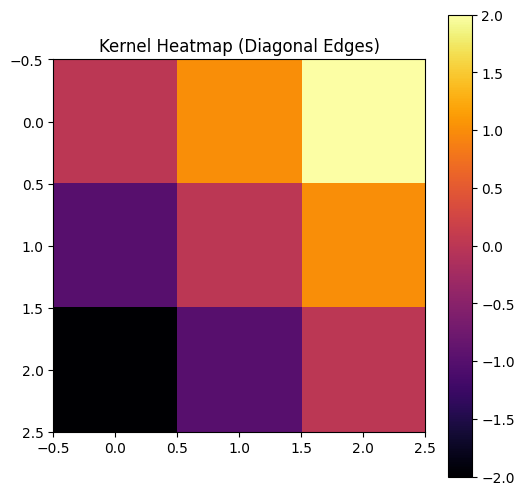

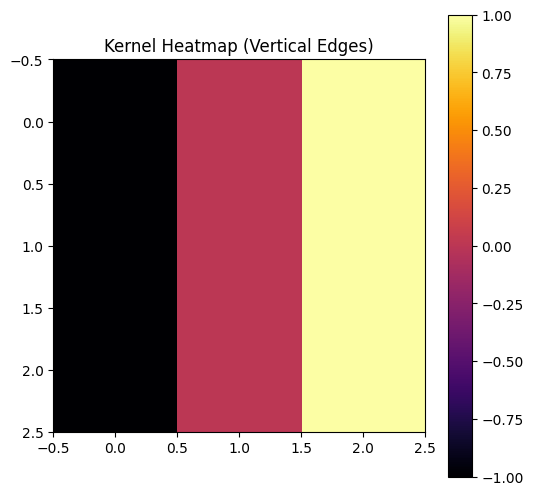

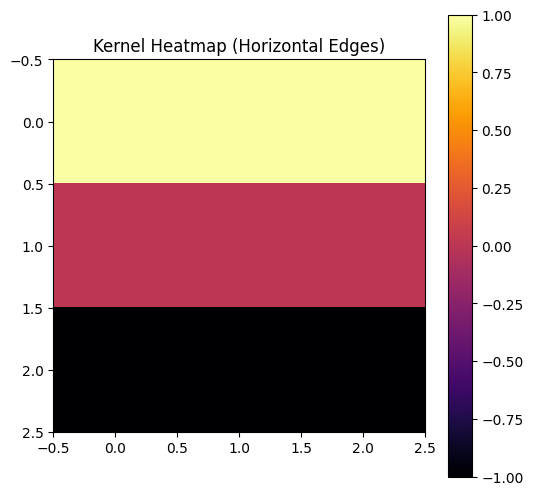

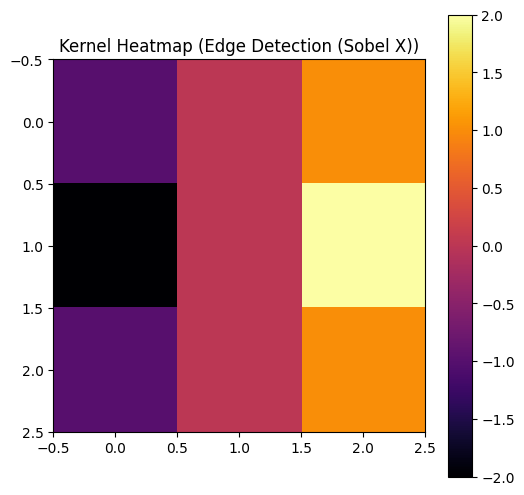

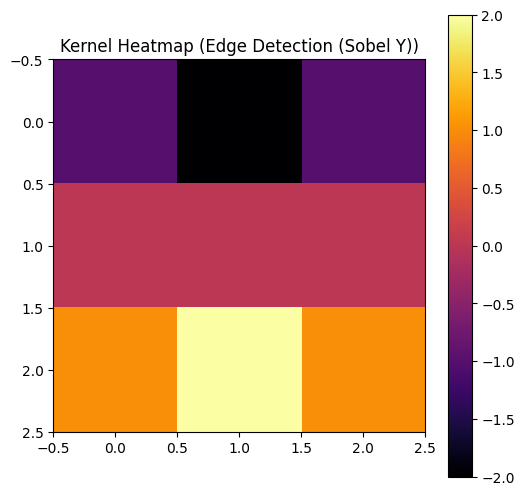

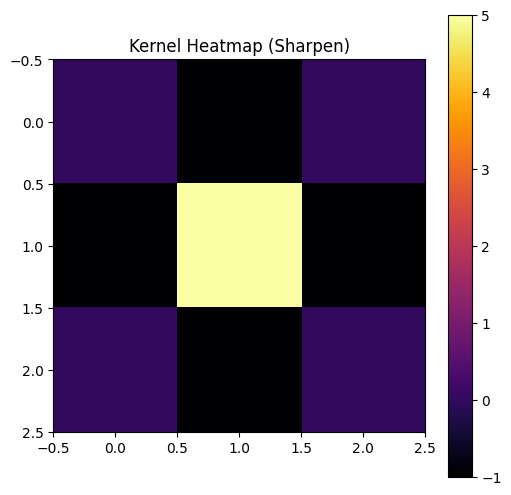

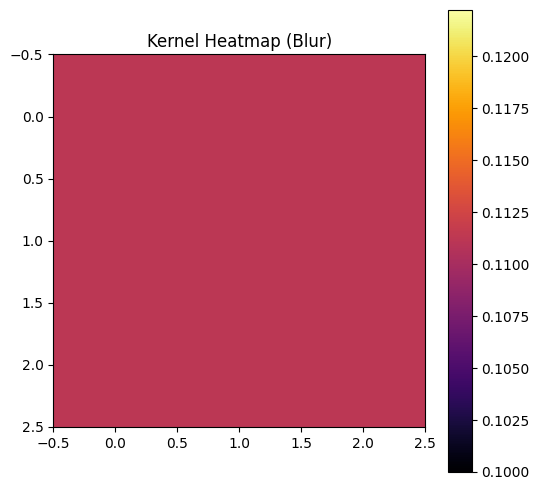

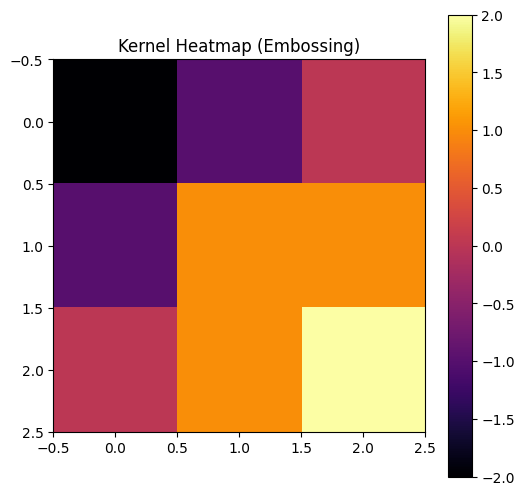

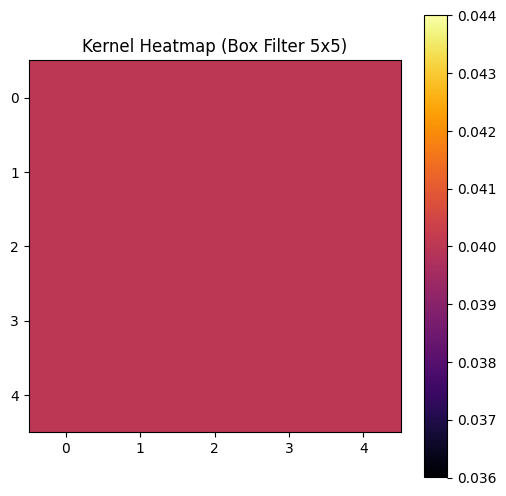

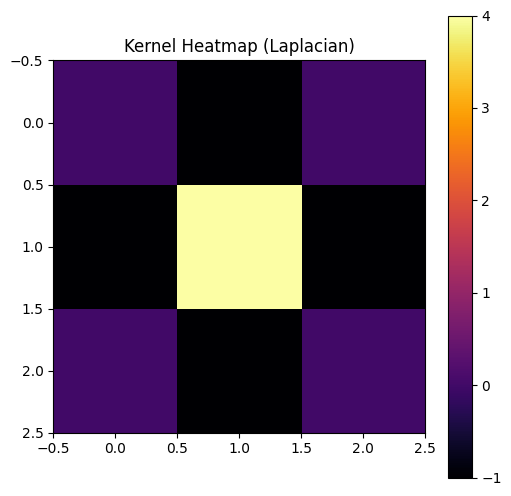

In [20]:
for name in filters.keys():
    selected_filter = filters[name]
    plt.figure(figsize=(6, 6))
    plt.title(f"Kernel Heatmap ({name})")
    plt.imshow(selected_filter, cmap='inferno')
    plt.colorbar()
    plt.show()

## Teoría de Texturas

Las texturas son patrones que se repiten o varían de manera consistente en una región. Los filtros pueden resaltar estas características analizando cambios en intensidades.
Filtros de Textura

Aplicamos Sobel y Laplaciano para capturar texturas.

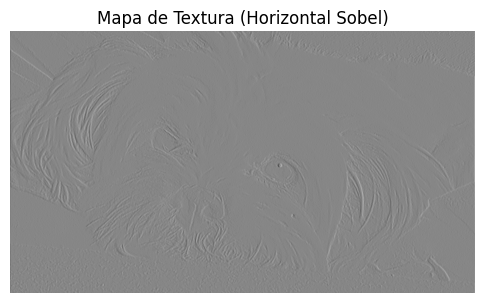

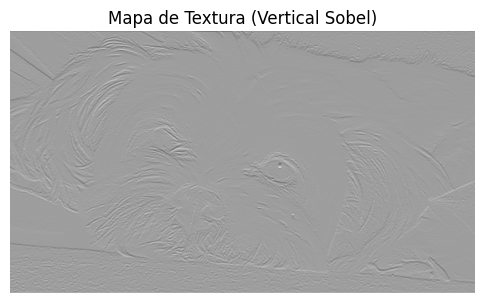

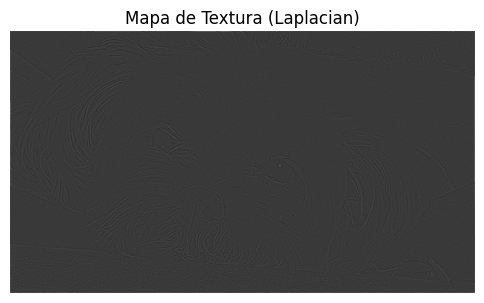

In [21]:
# Aplicar filtros de textura
texture_filters = {
    "Horizontal Sobel": filters["Edge Detection (Sobel X)"],
    "Vertical Sobel": filters["Edge Detection (Sobel Y)"],
    "Laplacian": filters["Laplacian"],
}

# Mostrar resultados de textura
for name, kernel in texture_filters.items():
    texture_image = convolve2d(image_gray*255, kernel, mode='same', boundary='fill', fillvalue=0)
    plt.figure(figsize=(6, 6))
    plt.title(f"Mapa de Textura ({name})")
    plt.imshow(texture_image, cmap='gray')
    plt.axis('off')
    plt.show()

## Estadísticas de Textura

Calcular media, desviación estándar y varianza de mapas de textura.

In [22]:
for name, kernel in texture_filters.items():
    texture_image = convolve2d(255*image_gray, kernel, mode='same', boundary='fill', fillvalue=0)
    mean_texture = np.mean(texture_image)
    std_texture = np.std(texture_image)
    var_texture = np.var(texture_image)

    print(f"Statistics for {name}:")
    print(f"  Mean: {mean_texture:.2f}")
    print(f"  Standard Deviation: {std_texture:.2f}")
    print(f"  Variance: {var_texture:.2f}")
    print("\n")


Statistics for Horizontal Sobel:
  Mean: -0.03
  Standard Deviation: 33.94
  Variance: 1151.63


Statistics for Vertical Sobel:
  Mean: -0.03
  Standard Deviation: 34.99
  Variance: 1224.59


Statistics for Laplacian:
  Mean: 0.21
  Standard Deviation: 6.88
  Variance: 47.30




## Actividades a realizar

## Actividad B1: Combinación de filtros

1. Diseñar un filtro que combine detección de bordes y suavizado.

### Apartado 1:

Combinar filtros consiste en sumar sus *kernels* para combinar sus efectos, por lo que tendremos que sumar un *kernel* de detección de bordes (por ejemplo, detección de bordes diagonales) y un filtro de suavizado. 

**Nota:** Esto **NO** es lo mismo que aplicar los dos *kernels* sucesivamente.

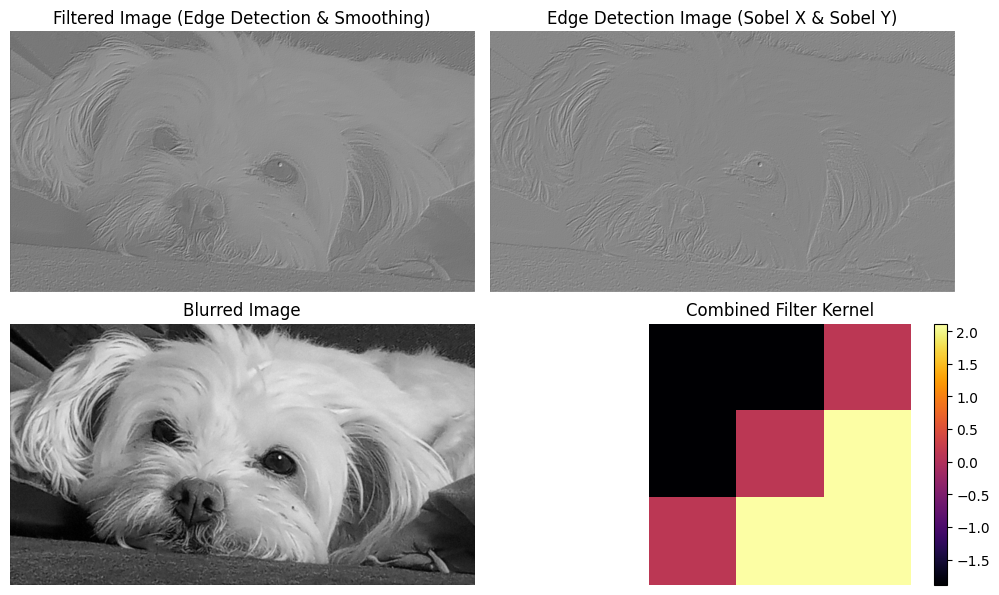

In [23]:
# Construimos el filtro combinado
diag_edge_and_smooth : np.ndarray = filters["Edge Detection (Sobel X)"] + filters["Edge Detection (Sobel Y)"] + filters["Blur"]
diag_edge_and_smooth = diag_edge_and_smooth / np.sum(diag_edge_and_smooth) # Lo normalizamos para evitar alteraciones en el brillo

# Aplicamos filtro combinado y los filtros originales
diag_edge_and_smooth_img : np.ndarray = convolve2d(255*image_gray, diag_edge_and_smooth, mode='same', boundary='fill', fillvalue=0)
edge_img                 : np.ndarray = convolve2d(255*image_gray, filters["Edge Detection (Sobel X)"] + filters["Edge Detection (Sobel Y)"], mode='same', boundary='fill', fillvalue=0)
blur_img                 : np.ndarray = convolve2d(255*image_gray, filters["Blur"], mode='same', boundary='fill', fillvalue=0)

# Ploteamos el resultado, el filtro combinado y los filtros originales
plt.figure(figsize=(10, 6))

plt.subplot(2,2,1)
plt.title("Filtered Image (Edge Detection & Smoothing)")
plt.imshow(diag_edge_and_smooth_img, cmap='gray')
plt.axis('off')

plt.subplot(2,2,2)
plt.title("Edge Detection Image (Sobel X & Sobel Y)")
plt.imshow(edge_img, cmap='gray')
plt.axis('off')

plt.subplot(2,2,3)
plt.title("Blurred Image")
plt.imshow(blur_img, cmap='gray')
plt.axis('off')

plt.subplot(2,2,4)
plt.title("Combined Filter Kernel")
plt.imshow(diag_edge_and_smooth, cmap='inferno')
plt.colorbar(fraction=0.046)
plt.axis('off')

plt.tight_layout()
plt.show()

## Actividad B2: Combinación de filtros

1. Aplicar filtros a imágenes de color (separando los canales RGB).

### Apartado 1:

Vamos a aplicar un filtro que combine la detección de bordes verticales y horizontales a una nueva imágen a color que cargaremos.

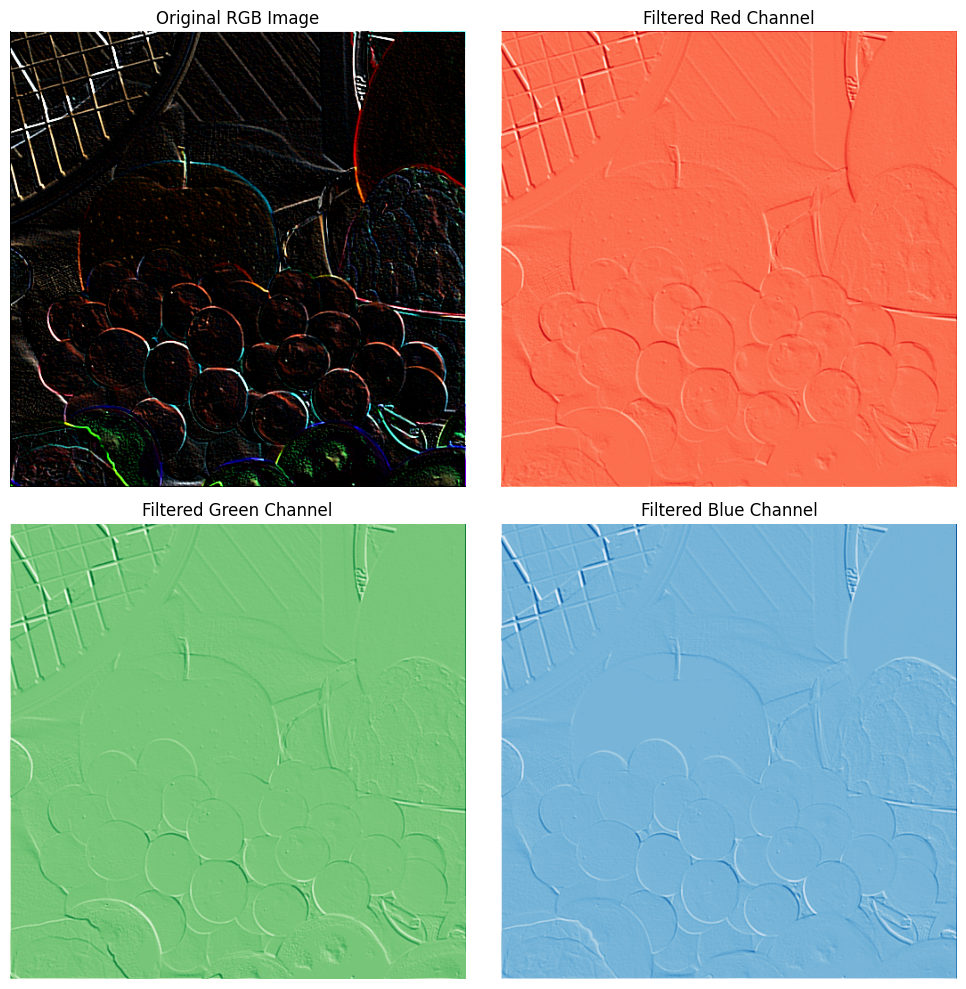

In [24]:
# Empezamos cargando la imágen a color
fruits_color = imread("imagenes/notebook_2/fruits.jpg")

# Extraemos cada uno de los tres canales de la imagen
fruits_B = fruits_color[:,:,0]
fruits_G = fruits_color[:,:,1]
fruits_R = fruits_color[:,:,2]

# Creamos el filtro combinado
simple_edge_detection = filters["Vertical Edges"] + filters["Horizontal Edges"] 

# Lo aplicamos a cada canal de la imagen (estas matrices si tienen sus valores entre 0 y 255, por eso no se multiplica)
filtered_fruits_B = convolve2d(fruits_B, simple_edge_detection, mode='same', boundary='fill', fillvalue=0)
filtered_fruits_G = convolve2d(fruits_G, simple_edge_detection, mode='same', boundary='fill', fillvalue=0)
filtered_fruits_R = convolve2d(fruits_R, simple_edge_detection, mode='same', boundary='fill', fillvalue=0)

# Hacemos clipping para que la imagen RGB filtrada tenga sus valores en el rango adecuado
filtered_fruits_B_clipped = np.clip(filtered_fruits_B, 0, 255).astype(np.uint8)
filtered_fruits_G_clipped = np.clip(filtered_fruits_G, 0, 255).astype(np.uint8)
filtered_fruits_R_clipped = np.clip(filtered_fruits_R, 0, 255).astype(np.uint8)

# Combinamos los canales filtrados
filtered_fruits = np.stack((filtered_fruits_R_clipped, filtered_fruits_G_clipped, filtered_fruits_B_clipped), axis=-1)

# Ploteamos los resultados
plt.figure(figsize=(10, 10))

plt.subplot(2,2,1)
plt.title("Original RGB Image")
plt.imshow(filtered_fruits)
plt.axis('off')

plt.subplot(2,2,2)
plt.title("Filtered Red Channel")
plt.imshow(filtered_fruits_R, cmap='Reds')
plt.axis('off')

plt.subplot(2,2,3)
plt.title("Filtered Green Channel")
plt.imshow(filtered_fruits_G, cmap='Greens')
plt.axis('off')

plt.subplot(2,2,4)
plt.title("Filtered Blue Channel")
plt.imshow(filtered_fruits_B, cmap='Blues')
plt.axis('off')

plt.tight_layout()
plt.show()

## Actividad B3: Mapas de textura
    
1. Crear mapas de textura para diferentes regiones y compararlos.

### Apartado 1:

Cargaremos una imágen y obtendremos un mapa de textura a partir de ella.

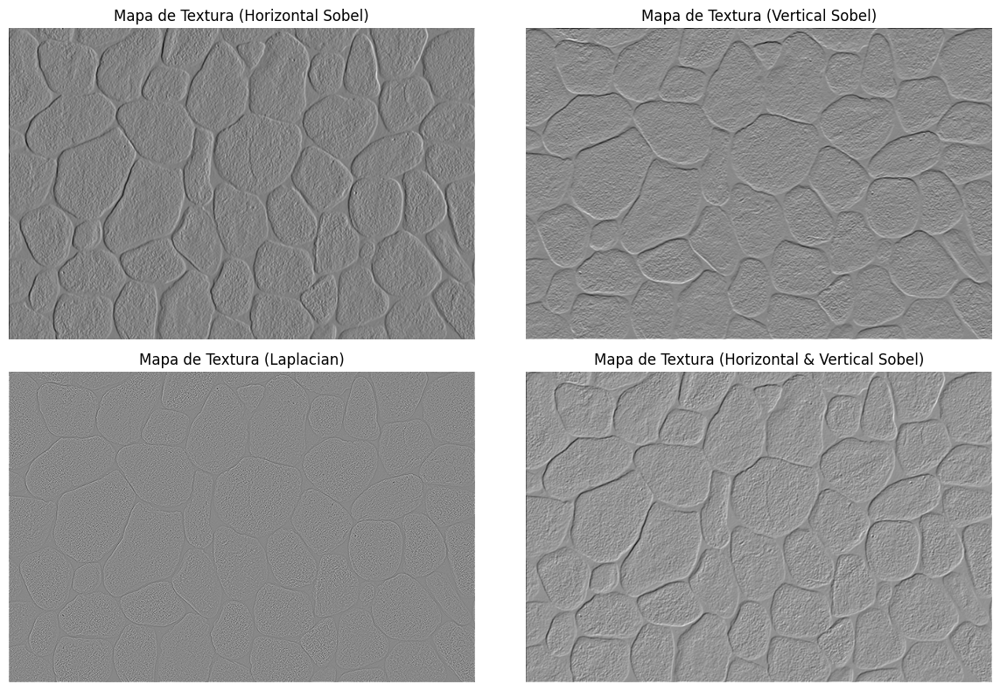

In [25]:
# Empezamos cargando la imágen en escala de grises
piedras_img = color.rgb2gray(imread("imagenes/notebook_2/piedras.jpg"))

# Aplicamos los filtros que nos permiten extraer texturas
plt.figure(figsize=(12, 8))
for i, items in enumerate(texture_filters.items(), start=1):
    name, kernel = items
    texture_image = convolve2d(piedras_img*255, kernel, mode='same', boundary='fill', fillvalue=0)
    
    plt.subplot(2,2,i)
    plt.title(f"Mapa de Textura ({name})")
    plt.imshow(texture_image, cmap='gray')
    plt.axis('off')

# Aplicamos un ultimo filtro que sea la combinacion del Sobel horizontal y vertical
texture_image = convolve2d(piedras_img*255, texture_filters["Horizontal Sobel"] + texture_filters["Vertical Sobel"], mode='same', boundary='fill', fillvalue=0)

plt.subplot(2,2,4)
plt.title(f"Mapa de Textura (Horizontal & Vertical Sobel)")
plt.imshow(texture_image, cmap='gray')
plt.axis('off')

plt.tight_layout()
plt.show()

## Actividad B4: Filtro personalizado
    
1. Diseñar un filtro, mostrarlo como mapa de calor y aplicarlo a una imagen en escala de grises.

### Apartado 1:

Construiremos un filtro cuyo objetivo es tratar de dar algo más de calidad a imágenes *blurreadas* resaltando el contraste entre el píxel central del *kernel* y sus vecinos en una vecindad con forma de rombo.

In [35]:
import math 

# Funcion que construye una matriz rombo cuadrada de dimension IMPAR donde cada elemento en el rombo es
# el negativo de la inversa de su distancia al (0,0) (considerando el (0,0) como el centro del kernel).
# El resto de elementos son 0, salvo el centro que es {central_weight}
def matriz_rombo(n : int, central_weight : float) -> np.ndarray:
    # Comprobamos que la dimension es impar
    if n % 2 == 0: raise Exception("Error! Esta función sólo admite dimensiones (n) impares!")
    
    # Lista que transformaremos en el array a retornar
    result : list[float] = []
    
    # Array resultado
    arr_result : np.ndarray

    # Construimos solo la mitad inferior del rombo, de abajo hacia arriba (desde n//2 hasta 0, disminuyendo de 1 en 1)
    for i in range(n//2, -1,-1):
        result += [[0.0]*i+[1]*(n-(2*i))+[0.0]*i]

    # Construimos el rombo de unos
    result = result + result[:-1][::-1]

    # Ahora, asignamos a cada elemento que no sea 0 (o el centro) el inverso de su distancia al centro en negativo (considerando que el centro es el punto (0,0) del kernel...)
    center_x = n//2
    center_y = n//2

    for row in range(n):
        for col in range(n):
            if (result[row][col] == 0 or (row == center_x and col == center_y)):
                result[row][col] = 0.0
            
            else:
                result[row][col] = -1/math.sqrt((center_x - row)**2 + (center_y - col)**2)  
    
    # Construimos ahora un array de numpy con el rombo modificado
    arr_result = np.array(result)

    # Retornamos el array construido, modificando antes el elemento central para que tenga mucho peso
    arr_result[n//2, n//2] = central_weight

    return arr_result

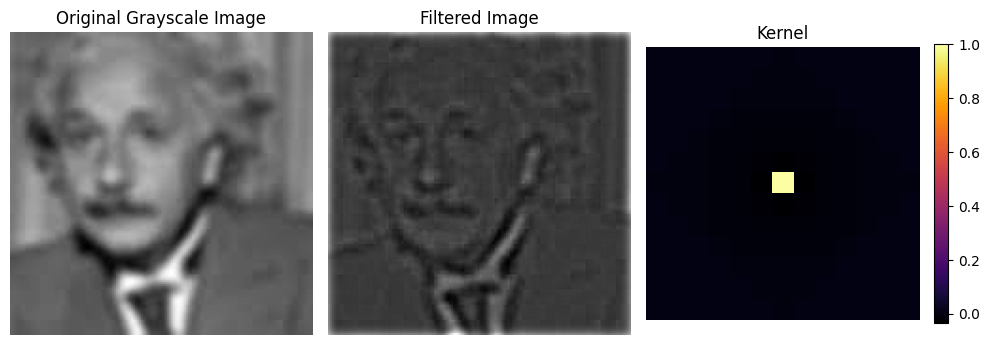

In [92]:
# Cargamos la imagen blurreada
blurred_einstein = color.rgb2gray(imread("imagenes/notebook_2/blurred_einstein.jpg"))

# Obtenemos nuestro filtro y lo normalizamos (media 0 y con sus valores entre 0 y 1)
mi_filtro = matriz_rombo(13, 30.0)
mi_filtro = mi_filtro - np.mean(mi_filtro)
mi_filtro = mi_filtro / np.max(mi_filtro)

# Filtramos la imagen
blurred_einstein_filtered = convolve2d(blurred_einstein * 255, mi_filtro, mode='same', boundary='fill', fillvalue=0)

# Graficamos los resultados
plt.figure(figsize=(10, 10))

plt.subplot(1,3,1)
plt.title("Original Grayscale Image")
plt.imshow(blurred_einstein, cmap='gray')
plt.axis('off')

plt.subplot(1,3,2)
plt.title("Filtered Image")
plt.imshow(blurred_einstein_filtered, cmap='gray')
plt.axis('off')

plt.subplot(1,3,3)
plt.title("Kernel")
plt.imshow(mi_filtro, cmap='inferno')
plt.colorbar(fraction=0.046)
plt.axis('off')

plt.tight_layout()
plt.show()

Ahora, para finalizar, enseñamos nuestro filtro con algunos valores distintos

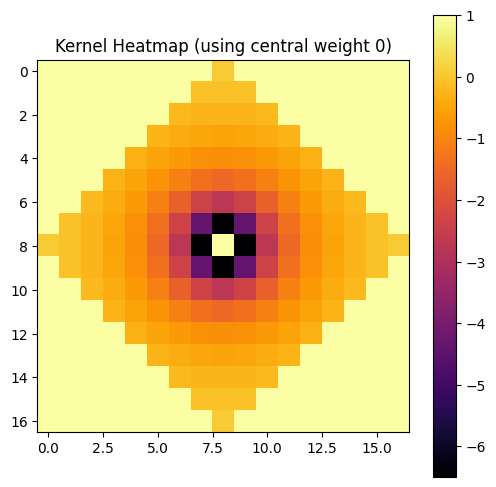

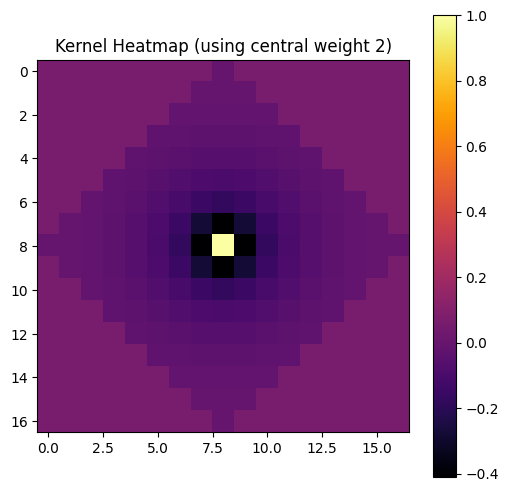

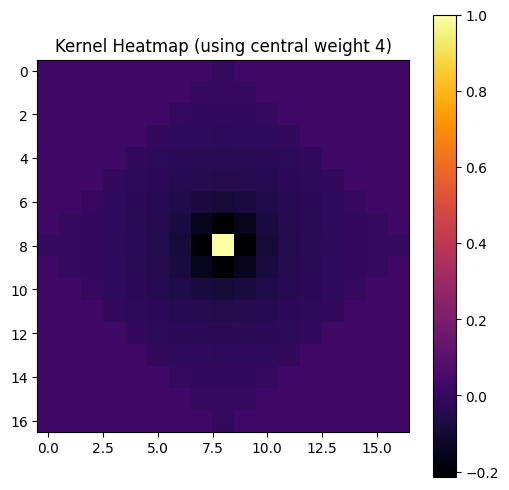

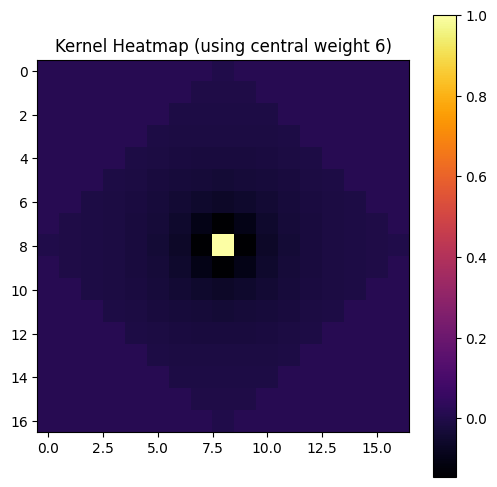

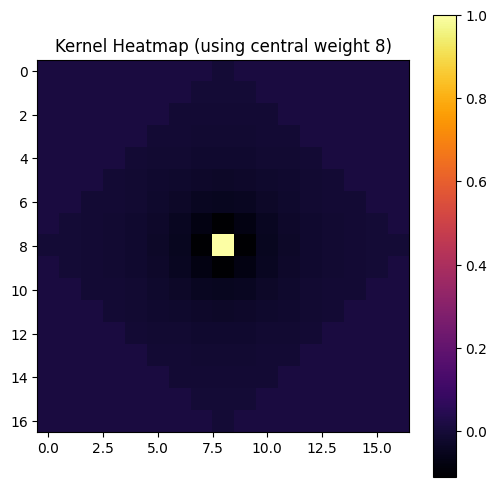

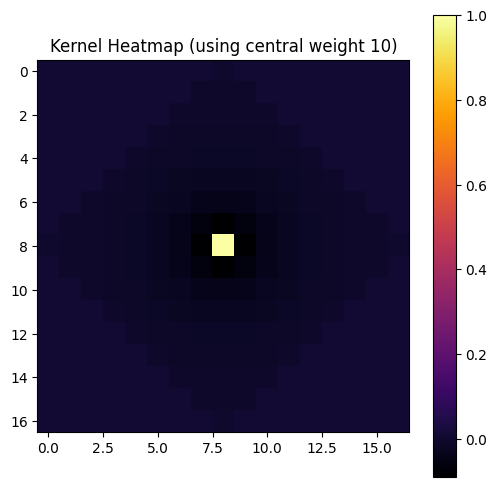

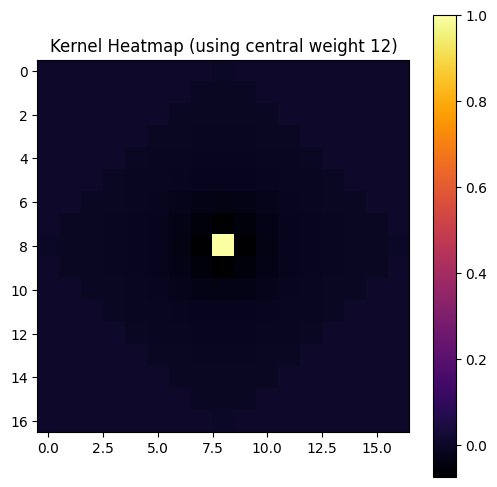

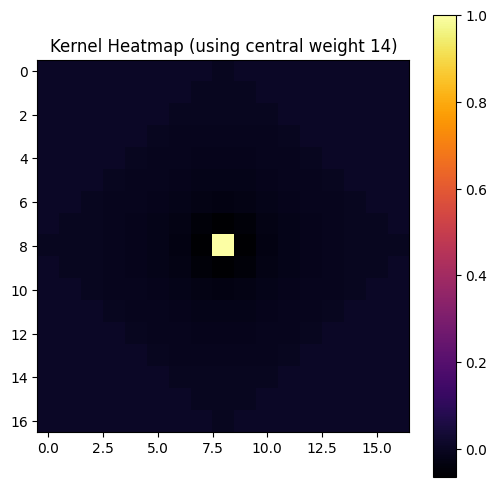

In [68]:
max_weight = 15
step = 2
for weight in range(0, max_weight + 1, step):
    selected_filter = matriz_rombo(17, weight)
    selected_filter = selected_filter - np.mean(selected_filter)
    selected_filter = selected_filter / np.max(selected_filter)
    plt.figure(figsize=(6, 6))
    plt.title(f"Kernel Heatmap (using central weight {weight})")
    plt.imshow(selected_filter, cmap='inferno')
    plt.colorbar()
    plt.show()